In [1]:
%run ./Preamble.ipynb

all_models = PM.check_for_existing_patterns("activations")
# Uncomment below lines to use specific model sets:
# all_models=PM.gpt2xl_models
# all_models=PM.gpt2_models
# all_models=['gpt2','gpt2-untrained_1','gpt2-untrained_1_weight_config_all']
print(all_models)



['gpt2-xl', 'gpt2-xl-untrained_1', 'gpt2', 'gpt2-untrained_1', 'gpt2-untrained_2', 'gpt2-untrained_3', 'gpt2-untrained_4', 'gpt2-untrained_5', 'gpt2-untrained_6', 'gpt2-untrained_7', 'gpt2-untrained_8', 'gpt2-untrained_9', 'gpt2-untrained_1_weight_config_all', 'gpt2-untrained_2_weight_config_all', 'gpt2-untrained_3_weight_config_all', 'gpt2-untrained_4_weight_config_all', 'gpt2-untrained_5_weight_config_all', 'gpt2-untrained_6_weight_config_all', 'gpt2-untrained_7_weight_config_all', 'gpt2-untrained_8_weight_config_all', 'gpt2-untrained_9_weight_config_all']


In [2]:
exp = "exp2"  # Define the experiment folder code

# Load all calculated neuron activations (one activation per word per category per model)
master_activations_df = pd.read_pickle(PM.directories[exp] / "master_activations_df_quicksave.pkl")

# Load the selective neuron indices data from a CSV file
unique_selective_neurons = PM.load_data(exp, "unique_selective_neurons_quicksave.csv")

# Filter out neurons in the dropout layer that have not yet been processed by the neural network layers.
unique_selective_neurons_no_drop = unique_selective_neurons[unique_selective_neurons["layer"] != "drop"]


In [3]:
def calc_array66(selective_neurons_inds_df, max_num_neurons=30, split_name="Xss_6_train", model_label=None):
    """
    Calculate and return the activations for selective neurons grouped by category for a given model.

    Args:
        selective_neurons_inds_df (pd.DataFrame): DataFrame containing neuron indices for selective neurons.
        max_num_neurons (int): Maximum number of neurons to consider.
        split_name (str): Dataset split name (e.g., "Xss_6_train").
        model_label (str): Label for the model being processed.
    
    Returns:
        dict: A dictionary where each key corresponds to a category index and contains activations.
    """
    
    def calc_array6s(selective_neurons_inds_df, max_num_neurons=30, selective_ind=0, split_name="Xss_6_train", **kwargs):
        """
        Compute the activations for a specific category (selective index).

        Args:
            selective_neurons_inds_df (pd.DataFrame): DataFrame containing neuron indices for selective neurons.
            max_num_neurons (int): Maximum number of neurons to consider.
            selective_ind (int): Category index for which activations are computed.
            split_name (str): Dataset split name (e.g., "Xss_6_train").
        
        Returns:
            list: List of activations for the six categories.
        """
        # Filter the DataFrame for the specific category
        selective_neurons_inds_df = select_data(selective_neurons_inds_df, cat_ind=selective_ind)
        max_num_words = max_num_neurons * 6
        array6s = []
        
        # Iterate over all six categories and calculate activations
        for cat_ind in range(6):
            activations = np.array([
                master_activations_df.loc[split_name, model, layer, cat_ind, neuron_idx]["activations"]
                for (model, layer, neuron_idx), _ in selective_neurons_inds_df.groupby(["model", "layer", "neuron_idx"])
            ])
            # Ensure 2D structure for activations
            if activations.ndim == 1:
                activations = activations[np.newaxis, :]
            activations = activations[:max_num_neurons, :max_num_words]
            array6s.append(activations)
        
        return array6s

    # Create a dictionary to store activations for each category
    array66_dict = {}
    for selective_ind in range(6):
        array6s = calc_array6s(
            selective_neurons_inds_df,
            max_num_neurons=max_num_neurons, 
            selective_ind=selective_ind, 
            split_name=split_name
        )
        # Skip invalid activations (e.g., empty arrays)
        if array6s[0].shape == 0 or array6s[1].shape == 0:
            continue
        array6s_tup = (array6s, model_label, split_name)
        array66_dict[selective_ind] = array6s_tup
    
    # Remove any entries with empty activations
    bad_ks = [k for k, v in array66_dict.items() if v[0][0].shape[0] == 0 or v[0][0].shape[1] == 0]
    for k in bad_ks:
        del array66_dict[k]
    
    return array66_dict


# Prepare data for analysis
selective_neurons_inds_df = DD.prep_df_for_analysis(unique_selective_neurons_no_drop)

# Calculate activations for various model groups (GPT-Trained, GPT-Untrained, etc.)
GPT_Trained_on_train_array66_dict = calc_array66(select_data(selective_neurons_inds_df, model_group="GPT-Trained"),
                            max_num_neurons=200, split_name="Xss_6_train", model_label="GPT-Trained")
GPT_Trained_on_valid_array66_dict = calc_array66(select_data(selective_neurons_inds_df, model_group="GPT-Trained"),
                            max_num_neurons=200, split_name="Xss_6_valid", model_label="GPT-Trained")
GPT_Untrained_on_train_array66_dict = calc_array66(select_data(selective_neurons_inds_df, model_group="GPT-Untrained"),
                            max_num_neurons=200, split_name="Xss_6_train", model_label="GPT-Untrained")
GPT_Untrained_on_valid_array66_dict = calc_array66(select_data(selective_neurons_inds_df, model_group="GPT-Untrained"),
                            max_num_neurons=200, split_name="Xss_6_valid", model_label="GPT-Untrained")


# Visualization Functions for Neuron Activations (For Thesis Publication)

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_gpt_trained_on_train}
    \caption{caption for fig:e2 gpt trained on train}
    \label{fig:e2_gpt_trained_on_train}
    \end{figure} % \ref{fig:e2_gpt_trained_on_train}


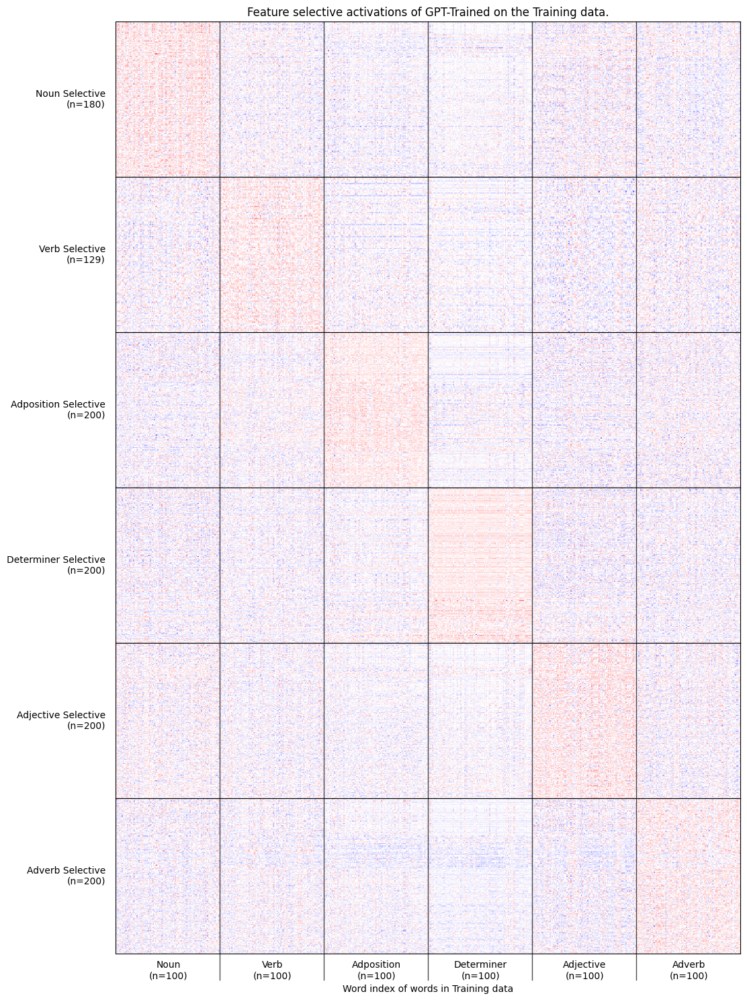

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_gpt_trained_on_valid}
    \caption{caption for fig:e2 gpt trained on valid}
    \label{fig:e2_gpt_trained_on_valid}
    \end{figure} % \ref{fig:e2_gpt_trained_on_valid}


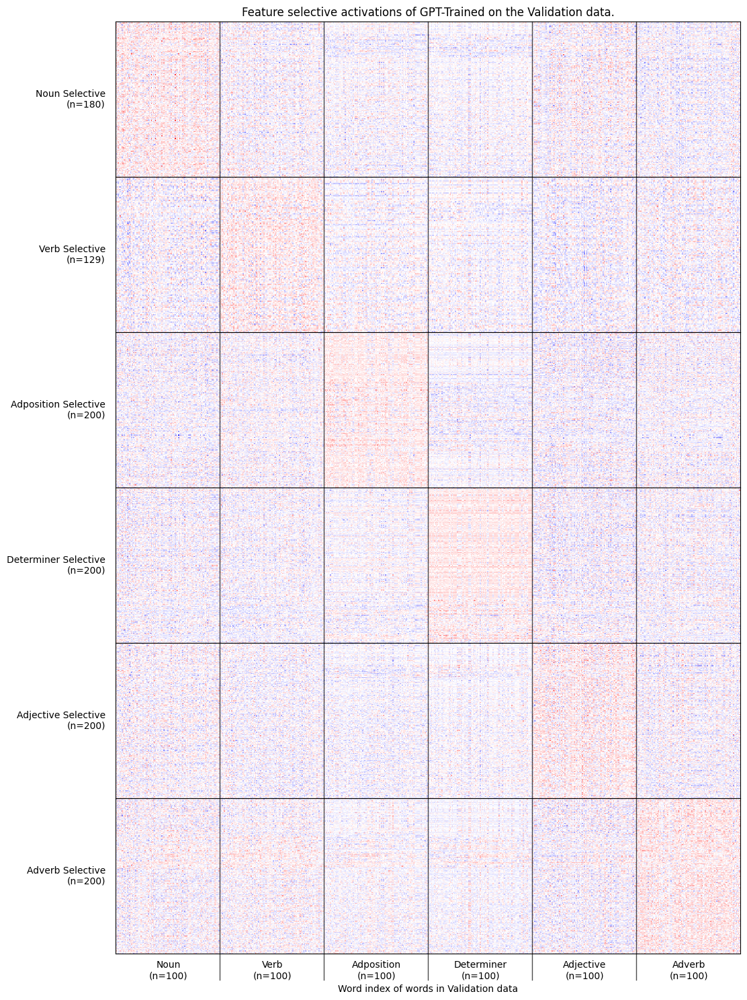

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_gpt_untrained_on_train}
    \caption{caption for fig:e2 gpt untrained on train}
    \label{fig:e2_gpt_untrained_on_train}
    \end{figure} % \ref{fig:e2_gpt_untrained_on_train}


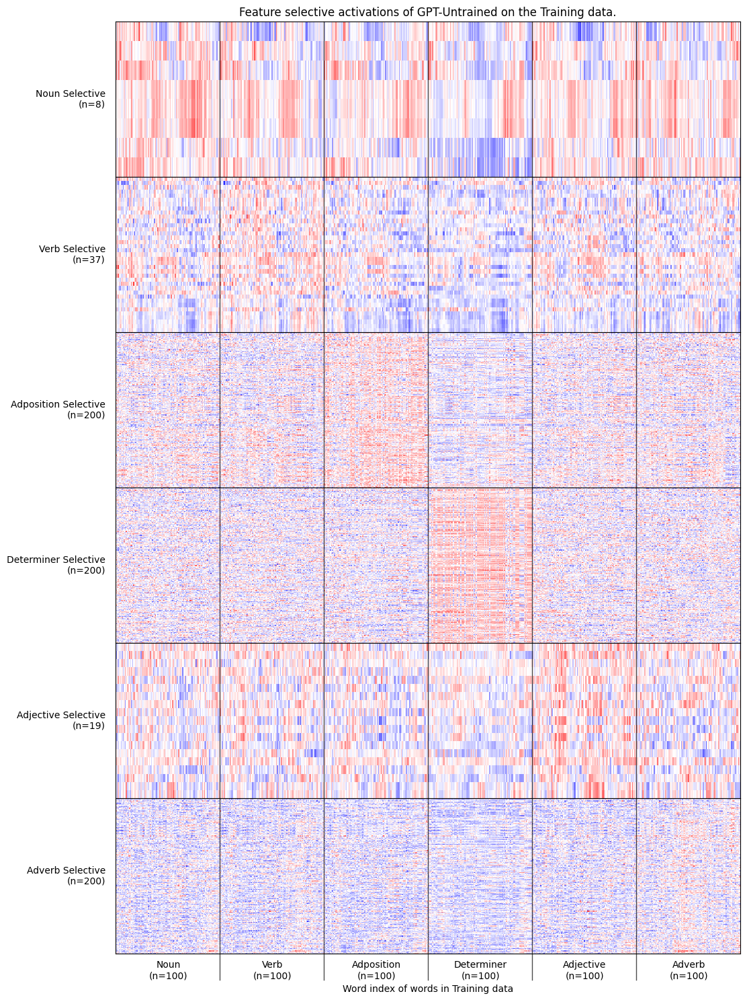

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_gpt_untrained_on_valid}
    \caption{caption for fig:e2 gpt untrained on valid}
    \label{fig:e2_gpt_untrained_on_valid}
    \end{figure} % \ref{fig:e2_gpt_untrained_on_valid}


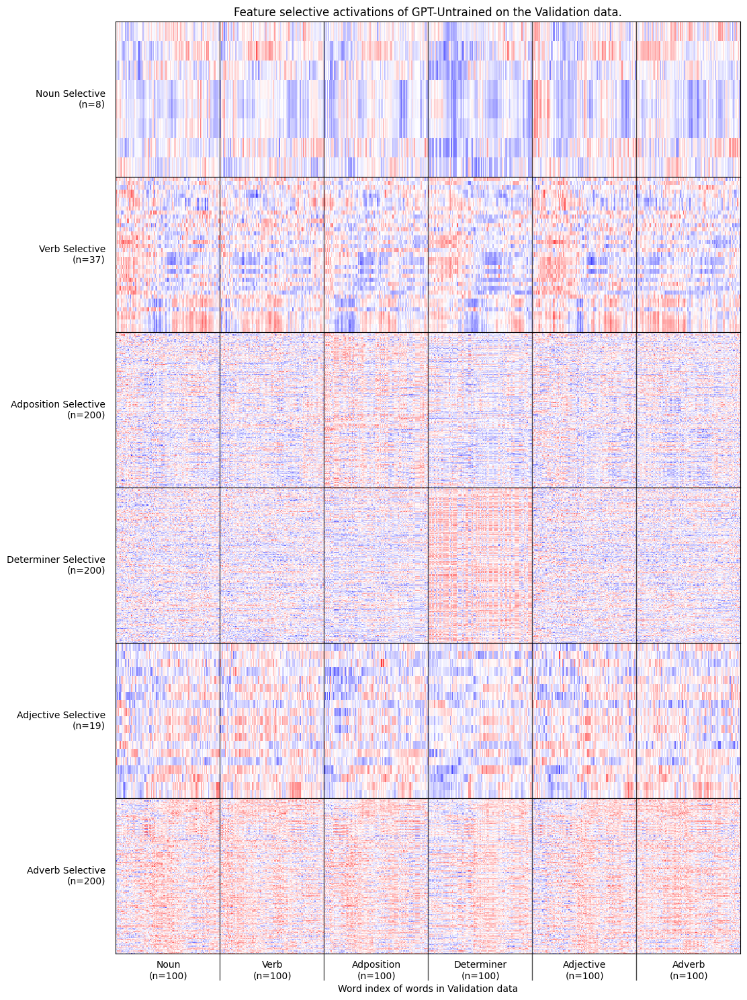

In [4]:
_=importlib.reload(my_latex_tools)
from my_latex_tools import *
_=importlib.reload(DataDisplayer)
DD = DataDisplayer.DataDisplayer(PM)

def plot_array66_together(array66_dict,max_words_per_cat=50,max_num_neurons=100,plot_label=None):
    """
    Plot the activations of category-selective neurons across all categories together.

    Args:
        array66_dict (dict): Dictionary containing activations for each category and model.
        max_words_per_cat (int): Maximum number of words to display per category.
        max_num_neurons (int): Maximum number of neurons to plot.
        plot_label (str, optional): Label used for saving the plot.
    """
    # Create subplots for each category
    number_of_plots=len(array66_dict.keys())
    fig, axs = plt.subplots(number_of_plots,1, gridspec_kw={'hspace':0.00}) # sharex=True, sharey=True,gridspec_kw={'hspace':0.02,'wspace':0.02}
    axs=axs.reshape(-1)
    fig.set_size_inches(12, 3*number_of_plots) # 18

    # Determine the color scale limits across all activations
    vmin = min([np.concatenate(array6s).min() for _, (array6s, _, _) in array66_dict.items()])
    vmax = max([np.concatenate(array6s).max() for _, (array6s, _, _) in array66_dict.items()])
    extreme = max(vmax, -vmin)
    vmin, vmax = -extreme, extreme

    # Iterate through each selective index and plot
    for ax_idx,(selective_ind,(array6s, model_label, split_name)) in enumerate(array66_dict.items()):
        ax=axs[ax_idx]
        array6=np.concatenate([array6[:max_num_neurons,:max_words_per_cat] for array6 in array6s],axis=1)

        # Skip if the activations are empty
        if any(i==0 for i in array6.shape):
            print(f"No Activations of {model_label} over {DD.display_POS_6_names[selective_ind]}s in {DD.display_split_names[split_name]} data.")
            continue

        num_words=array6.shape[0]
        n_per_category=array6.shape[1]//6

        # Plot the activations as a heatmap
        im = ax.imshow(array6, vmin=vmin,vmax=vmax, cmap='bwr', aspect='auto', interpolation='none') # 'linearl_hot' , aspect='auto' , interpolation=None
        ax.set_ylabel(f"{DD.display_POS_6_names[selective_ind]} Selective\n(n={array6.shape[0]})", rotation=0,ha='right',va='center') 
        ax.tick_params(bottom = False) 
        ax.set_xticklabels([])
        ax.tick_params(left = False) 
        ax.set_yticklabels([])

        # Add x-axis labels for the last plot
        if selective_ind == 5:
            ax.set_xlabel(f"Word index of words in {DD.display_split_names[split_name]} data")
            ax.set_xticks([n_per_category*(1/2+i) for i in range(0,6)],[f"{DD.display_POS_6_names[i]}\n(n={n_per_category})" for i in range(0,6)])

        if selective_ind == 0:
            ax.set_title(f"Feature selective activations of {model_label} on the {DD.display_split_names[split_name]} data.")


    for j,ax in enumerate(axs):
        bboxes = sorted([l.get_window_extent() for l in ax.get_xticklabels()],key=lambda x: x.xmin)
        y1=ax.get_ylim()[1]
        y0=ax.get_ylim()[0]
        for i in range(1,6):
            if j==len(array66_dict)-1:
                text_ymin = min(bbox.ymin for bbox in bboxes)
                y0=ax.transData.inverted().transform((0,text_ymin))[1]

            linei = mpl.lines.Line2D((i*n_per_category-0.5,)*2,
                                     ylim:=(y0,y1),
                                     lw=1.0,
                                     clip_on=False,
                                     color=(0,0,0,0.7))
            _=ax.add_line(linei)

    # Save the plot if a label is provided
    if plot_label:
        save_figure_for_thesis(fig, fn=plot_label, v=0)
        
    # Show the plot
    plt.show()

# Define parameters for plotting
plot_kwargs={
    "max_words_per_cat":100,
    "max_num_neurons":600,
}

# Generate plots for trained and untrained GPT models
plot_array66_together(GPT_Trained_on_train_array66_dict,   plot_label="e2_GPT_Trained_on_train",   **plot_kwargs)
plot_array66_together(GPT_Trained_on_valid_array66_dict,   plot_label="e2_GPT_Trained_on_valid",   **plot_kwargs)
plot_array66_together(GPT_Untrained_on_train_array66_dict, plot_label="e2_GPT_Untrained_on_train", **plot_kwargs)
plot_array66_together(GPT_Untrained_on_valid_array66_dict, plot_label="e2_GPT_Untrained_on_valid", **plot_kwargs)

# plot_array66_together(XL_Trained_on_train_array66_dict,max_words_per_cat=max_words_per_cat,max_num_neurons=max_num_neurons)
# plot_array66_together(XL_Trained_on_valid_array66_dict,max_words_per_cat=max_words_per_cat,max_num_neurons=max_num_neurons)
# plot_array66_together(XL_Untrained_on_train_array66_dict,max_words_per_cat=max_words_per_cat,max_num_neurons=max_num_neurons)
# plot_array66_together(XL_Untrained_on_valid_array66_dict,max_words_per_cat=max_words_per_cat,max_num_neurons=max_num_neurons)


# Same Plots but adjusted for Thesis Slides
##### (Only use 100 instead of 200 selctive neurons, since slides are less verticle)

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_slides_gpt_trained_on_train}
    \caption{caption for fig:e2 slides gpt trained on train}
    \label{fig:e2_slides_gpt_trained_on_train}
    \end{figure} % \ref{fig:e2_slides_gpt_trained_on_train}


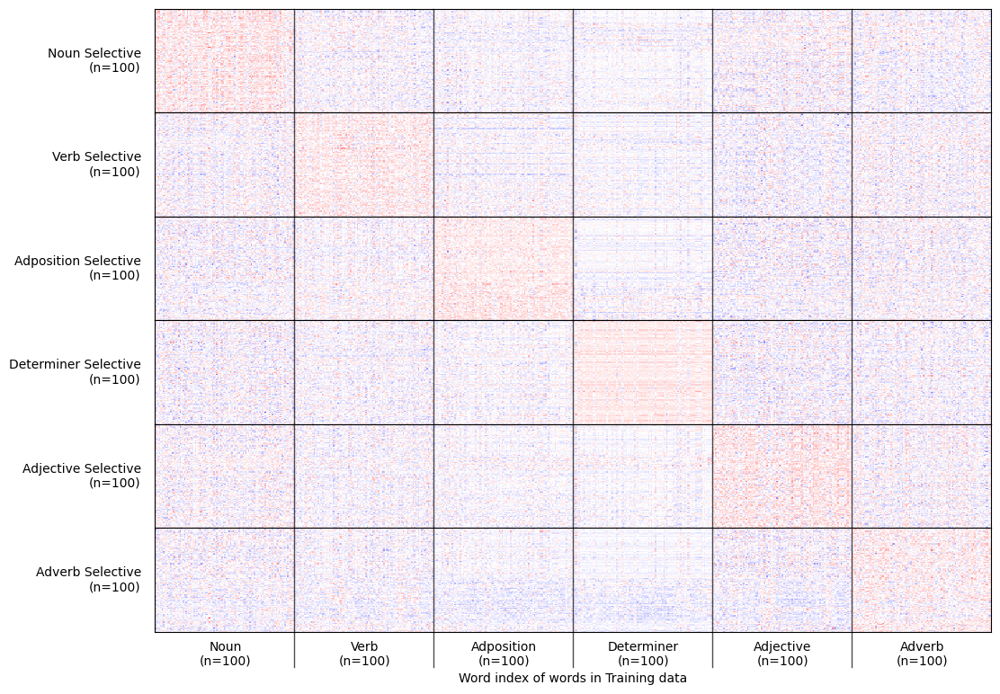

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_slides_gpt_trained_on_valid}
    \caption{caption for fig:e2 slides gpt trained on valid}
    \label{fig:e2_slides_gpt_trained_on_valid}
    \end{figure} % \ref{fig:e2_slides_gpt_trained_on_valid}


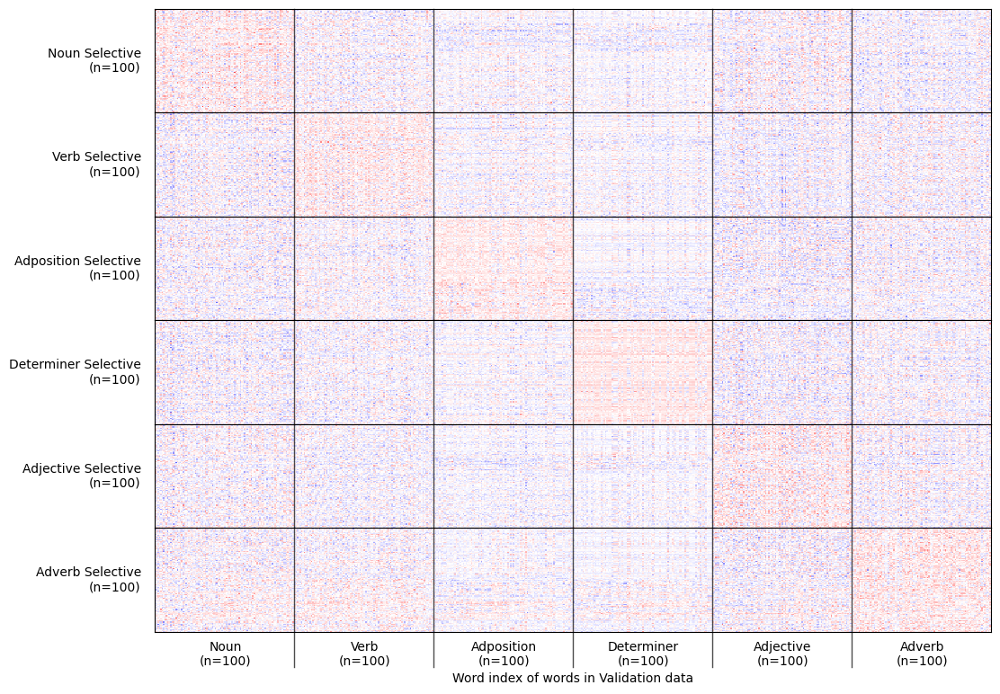

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_slides_gpt_untrained_on_train}
    \caption{caption for fig:e2 slides gpt untrained on train}
    \label{fig:e2_slides_gpt_untrained_on_train}
    \end{figure} % \ref{fig:e2_slides_gpt_untrained_on_train}


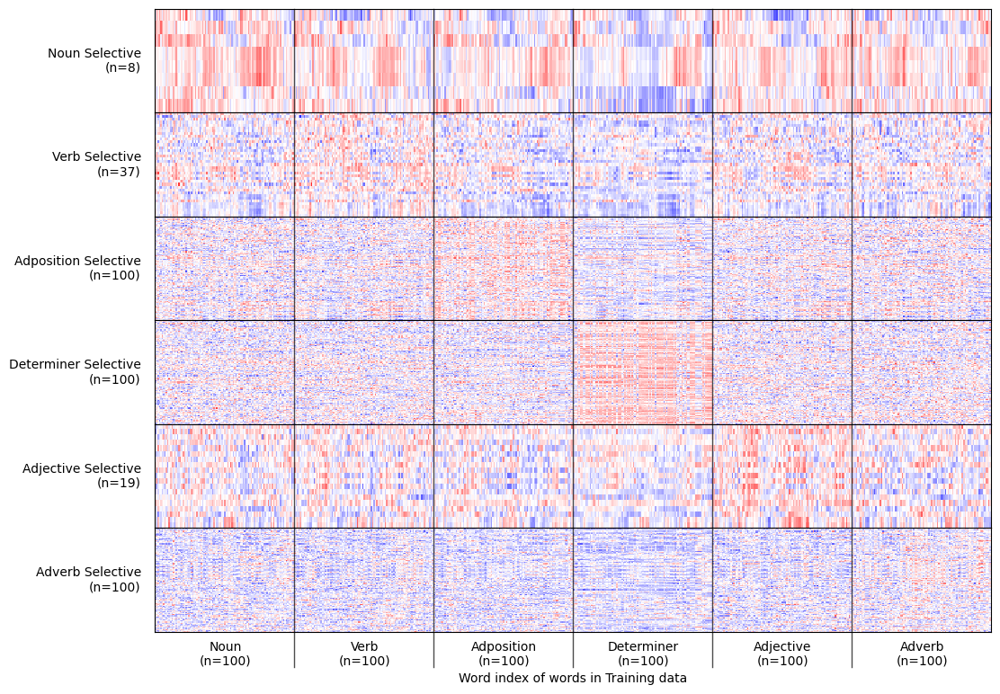

\begin{figure}
    \centering
    \includesvg[width=\linewidth]{inputs/fig/e2_slides_gpt_untrained_on_valid}
    \caption{caption for fig:e2 slides gpt untrained on valid}
    \label{fig:e2_slides_gpt_untrained_on_valid}
    \end{figure} % \ref{fig:e2_slides_gpt_untrained_on_valid}


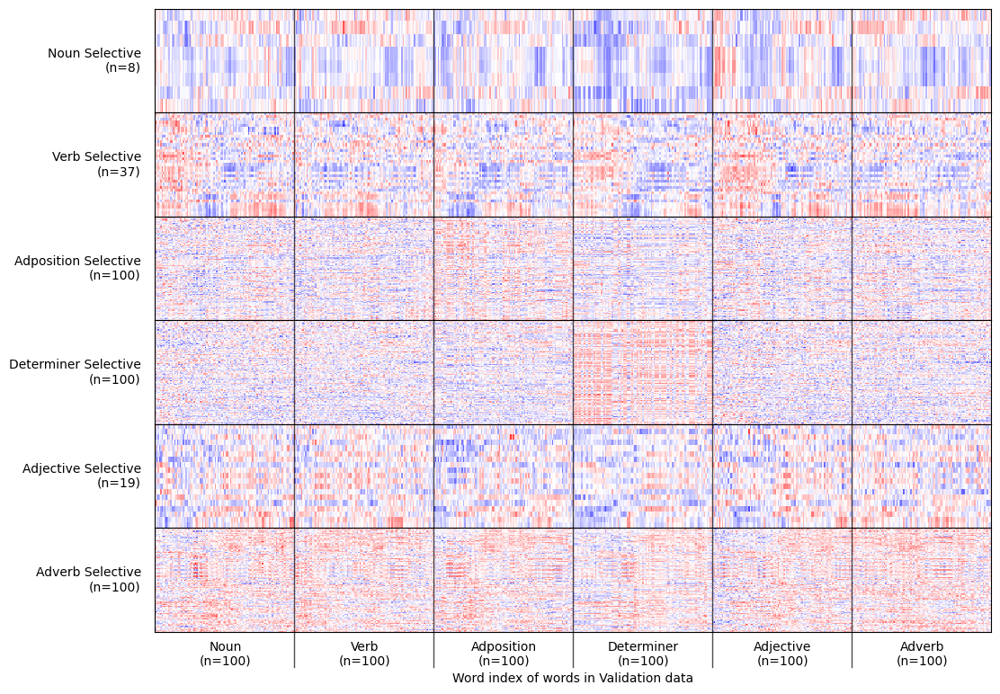

In [5]:
_=importlib.reload(my_latex_tools)
from my_latex_tools import *
_=importlib.reload(DataDisplayer)
DD = DataDisplayer.DataDisplayer(PM)

def plot_array66_together_for_slides(array66_dict,max_words_per_cat=50,max_num_neurons=100,plot_label=None,plotdims=None):
    """
    Plot the activations of category-selective neurons, optimized for presentation slides.

    Args:
        array66_dict (dict): Dictionary containing activations for each category and model.
        max_words_per_cat (int): Maximum number of words to display per category.
        max_num_neurons (int): Maximum number of neurons to plot.
        plot_label (str, optional): Label used for saving the plot.
        plotdims (tuple, optional): Dimensions of the plot.
    """
    
    # Create subplots for each category
    number_of_plots = len(array66_dict.keys())
    if not plotdims:
        plotdims = (12, 3 * number_of_plots)
    fig, axs = plt.subplots(number_of_plots, 1, gridspec_kw={'hspace': 0.00})
    axs = axs.reshape(-1)
    fig.set_size_inches(*plotdims)


    # Determine color scale limits across all activations
    vmin = min([np.concatenate(array6s).min() for _, (array6s, _, _) in array66_dict.items()])
    vmax = max([np.concatenate(array6s).max() for _, (array6s, _, _) in array66_dict.items()])
    extreme = max(vmax, -vmin)
    vmin, vmax = -extreme, extreme

    # Iterate through and plot for each selective index
    for ax_idx, (selective_ind, (array6s, model_label, split_name)) in enumerate(array66_dict.items()):
        ax=axs[ax_idx]
        array6 = np.concatenate([array6[:max_num_neurons,:max_words_per_cat] for array6 in array6s], axis=1)

        # Skip if the activations are empty
        if any(i == 0 for i in array6.shape):
            print(f"No Activations of {model_label} over {DD.display_POS_6_names[selective_ind]}s in {DD.display_split_names[split_name]} data.")
            continue

        num_words=array6.shape[0]
        n_per_category=array6.shape[1]//6

        # Plot the activations as a heatmap
        im = ax.imshow(array6, vmin=vmin,vmax=vmax, cmap='bwr', aspect='auto', interpolation='none') # 'linearl_hot' , aspect='auto' , interpolation=None
        ax.set_ylabel(f"{DD.display_POS_6_names[selective_ind]} Selective\n(n={array6.shape[0]})", rotation=0,ha='right',va='center')
        ax.tick_params(bottom = False) 
        ax.set_xticklabels([])
        ax.tick_params(left = False) 
        ax.set_yticklabels([])

        # Add x-axis labels for the last plot
        if selective_ind ==5:
            ax.set_xlabel(f"Word index of words in {DD.display_split_names[split_name]} data")
            ax.set_xticks([n_per_category*(1/2+i) for i in range(0,6)],[f"{DD.display_POS_6_names[i]}\n(n={n_per_category})" for i in range(0,6)])

    # Add grid lines separating categories
    for j,ax in enumerate(axs):
        bboxes = sorted([l.get_window_extent() for l in ax.get_xticklabels()],key=lambda x: x.xmin)
        y1 = ax.get_ylim()[1]
        y0 = ax.get_ylim()[0]
        for i in range(1,6):
            if j == len(array66_dict) - 1:
                text_ymin = min(bbox.ymin for bbox in bboxes)
                y0 = ax.transData.inverted().transform((0,text_ymin))[1] #*0.96

            linei = mpl.lines.Line2D((i*n_per_category-0.5,)*2,
                                     ylim:=(y0,y1),
                                     lw=1.0,
                                     clip_on=False,
                                     color=(0,0,0,0.7))
            ax.add_line(linei)

    # Save the plot if a label is provided
    if plot_label:
        save_figure_for_thesis(fig, fn=plot_label, v=0)
        
    # Show the plot
    plt.show()


plot_kwargs={
    "max_words_per_cat":100,
    "max_num_neurons":100,
    "plotdims":(12,9),
}
plot_array66_together_for_slides(GPT_Trained_on_train_array66_dict,   plot_label="e2_slides_GPT_Trained_on_train",   **plot_kwargs)
plot_array66_together_for_slides(GPT_Trained_on_valid_array66_dict,   plot_label="e2_slides_GPT_Trained_on_valid",   **plot_kwargs)
plot_array66_together_for_slides(GPT_Untrained_on_train_array66_dict, plot_label="e2_slides_GPT_Untrained_on_train", **plot_kwargs)
plot_array66_together_for_slides(GPT_Untrained_on_valid_array66_dict, plot_label="e2_slides_GPT_Untrained_on_valid", **plot_kwargs)
